# ⚠️ Auto-generated Notebook
    
This notebook is automatically compiled from source files in `/workspaces/awesome-matrix/src/examples/12_visualization_techniques`.
**Do not edit this file directly** as your changes will be overwritten.

To make changes:
1. Edit the source file `/workspaces/awesome-matrix/src/examples/12_visualization_techniques/02_3d_visualizations.py` instead
2. Run the compile script to regenerate this notebook

See [COMPILE.md](docs/COMPILE.md) for more information.


# 3D Visualizations of Matrix Transformations

In this notebook, we'll explore how to visualize matrices as transformations in 3D space. These visualizations provide powerful intuition for understanding linear algebra concepts like eigenvectors, rotations, and projections.

We'll cover:

1. Visualizing vectors and vector operations in 3D
2. Representing matrices as linear transformations
3. Visualizing eigenvectors and eigenvalues
4. Animating matrix transformations
5. Exploring projections and subspaces


In [1]:
import torch
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from mpl_toolkits.mplot3d.art3d import Poly3DCollection
import seaborn as sns
import matplotlib.animation as animation
from matplotlib.colors import LinearSegmentedColormap
from IPython.display import HTML

# Set style for plots
plt.style.use('ggplot')
sns.set(style="whitegrid", font_scale=1.2)

# Set seed for reproducibility
np.random.seed(42)
torch.manual_seed(42)


## Visualizing Vectors in 3D Space

Let's start by creating and visualizing vectors in 3D space. We'll create a function to plot multiple vectors from the origin.


In [2]:
def plot_vectors_3d(vectors, colors=None, labels=None, title="3D Vectors"):
    """
    Plot vectors in 3D space starting from the origin.
    
    Args:
        vectors: List of vectors (numpy arrays or torch tensors)
        colors: List of colors for each vector
        labels: List of labels for each vector
        title: Plot title
    """
    fig = plt.figure(figsize=(10, 8))
    ax = fig.add_subplot(111, projection='3d')
    
    # Convert tensors to numpy if needed
    vectors = [v.numpy() if isinstance(v, torch.Tensor) else v for v in vectors]
    
    # Set default colors and labels if not provided
    if colors is None:
        colors = plt.cm.tab10(np.linspace(0, 1, len(vectors)))
    if labels is None:
        labels = [f"Vector {i+1}" for i in range(len(vectors))]
    
    # Calculate the maximum magnitude for setting axis limits
    max_magnitude = max([np.linalg.norm(v) for v in vectors])
    axis_limit = max(1.5, max_magnitude * 1.2)  # Ensure we have some minimum space
    
    # Plot vectors
    for i, v in enumerate(vectors):
        ax.quiver(0, 0, 0, v[0], v[1], v[2], color=colors[i], arrow_length_ratio=0.1, 
                  label=labels[i], lw=2)
    
    # Draw a light-colored unit sphere for reference
    u = np.linspace(0, 2 * np.pi, 20)
    v = np.linspace(0, np.pi, 20)
    x = np.outer(np.cos(u), np.sin(v))
    y = np.outer(np.sin(u), np.sin(v))
    z = np.outer(np.ones(np.size(u)), np.cos(v))
    ax.plot_surface(x, y, z, color='lightgray', alpha=0.1)
    
    # Draw coordinate axes
    ax.quiver(0, 0, 0, axis_limit, 0, 0, color='red', arrow_length_ratio=0.05, alpha=0.5)
    ax.quiver(0, 0, 0, 0, axis_limit, 0, color='green', arrow_length_ratio=0.05, alpha=0.5)
    ax.quiver(0, 0, 0, 0, 0, axis_limit, color='blue', arrow_length_ratio=0.05, alpha=0.5)
    
    # Add axis labels and set limits
    ax.set_xlabel('X')
    ax.set_ylabel('Y')
    ax.set_zlabel('Z')
    ax.set_xlim([-axis_limit, axis_limit])
    ax.set_ylim([-axis_limit, axis_limit])
    ax.set_zlim([-axis_limit, axis_limit])
    
    # Add labels at the end of coordinate axes
    ax.text(axis_limit*1.1, 0, 0, "X", color='red')
    ax.text(0, axis_limit*1.1, 0, "Y", color='green')
    ax.text(0, 0, axis_limit*1.1, "Z", color='blue')
    
    # Add a grid and legend
    ax.grid(True)
    ax.legend()
    
    # Set title
    ax.set_title(title)
    
    plt.tight_layout()
    plt.show()
    
    return fig, ax


Let's create some vectors and visualize them:


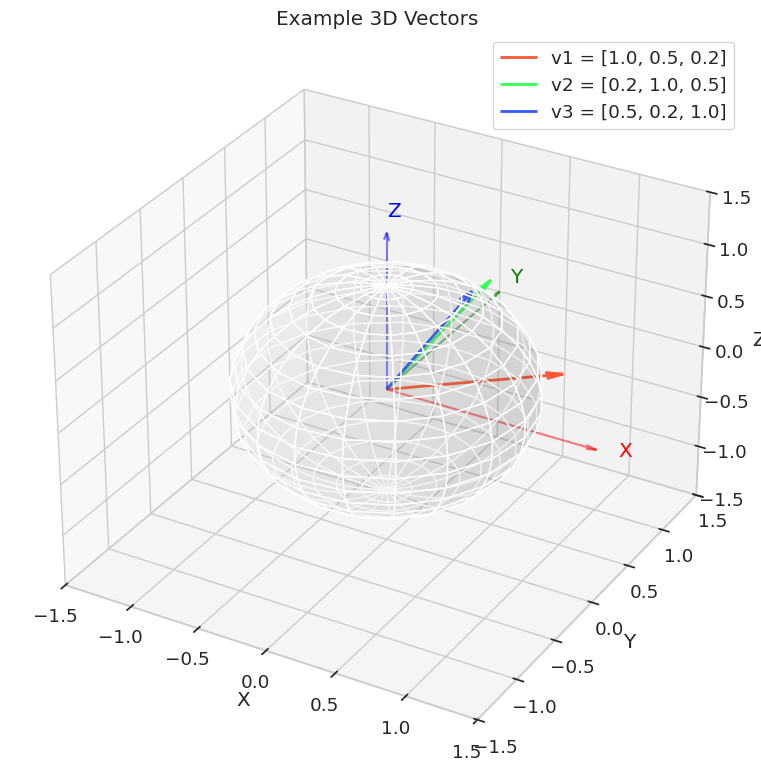

(<Figure size 1000x800 with 1 Axes>,
 <Axes3D: title={'center': 'Example 3D Vectors'}, xlabel='X', ylabel='Y', zlabel='Z'>)

In [3]:
# Create some 3D vectors
v1 = torch.tensor([1.0, 0.5, 0.2])
v2 = torch.tensor([0.2, 1.0, 0.5])
v3 = torch.tensor([0.5, 0.2, 1.0])

# Visualize the vectors
plot_vectors_3d(
    [v1, v2, v3],
    colors=['#FF5733', '#33FF57', '#3357FF'],
    labels=['v1 = [1.0, 0.5, 0.2]', 'v2 = [0.2, 1.0, 0.5]', 'v3 = [0.5, 0.2, 1.0]'],
    title="Example 3D Vectors"
)


### Vector Operations in 3D

Now let's visualize some basic vector operations in 3D space:


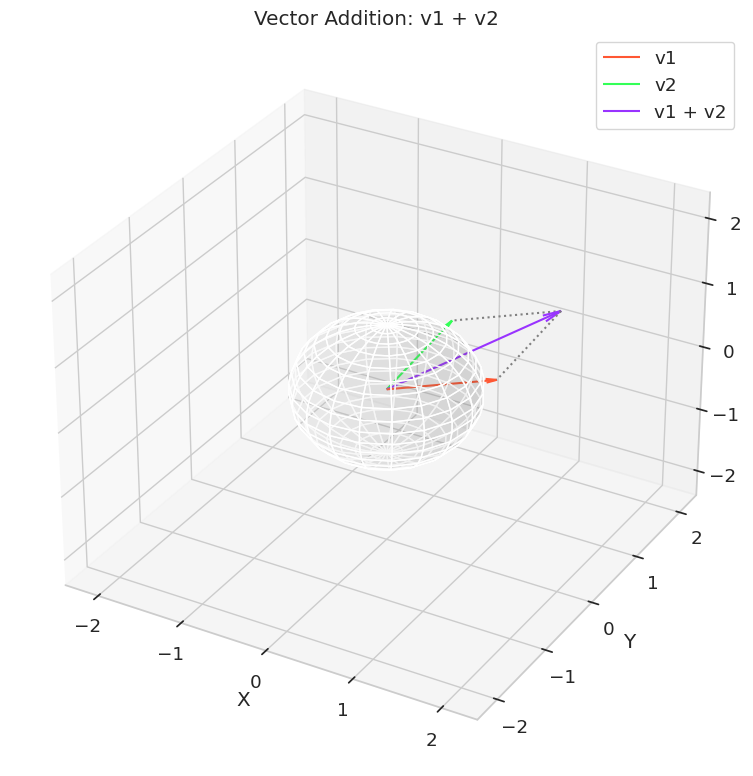

In [4]:
# Vector addition
v_sum = v1 + v2

# Create a figure to show vector addition
fig = plt.figure(figsize=(12, 8))
ax = fig.add_subplot(111, projection='3d')

# Draw original vectors
ax.quiver(0, 0, 0, v1[0], v1[1], v1[2], color='#FF5733', arrow_length_ratio=0.1, label='v1')
ax.quiver(0, 0, 0, v2[0], v2[1], v2[2], color='#33FF57', arrow_length_ratio=0.1, label='v2')

# Draw the sum vector
ax.quiver(0, 0, 0, v_sum[0], v_sum[1], v_sum[2], color='#9933FF', 
          arrow_length_ratio=0.1, label='v1 + v2')

# Draw the parallelogram
ax.quiver(v1[0], v1[1], v1[2], v2[0], v2[1], v2[2], color='gray', 
          arrow_length_ratio=0, linestyle='dotted')
ax.quiver(v2[0], v2[1], v2[2], v1[0], v1[1], v1[2], color='gray', 
          arrow_length_ratio=0, linestyle='dotted')

# Draw a light-colored unit sphere for reference
u = np.linspace(0, 2 * np.pi, 20)
v = np.linspace(0, np.pi, 20)
x = np.outer(np.cos(u), np.sin(v))
y = np.outer(np.sin(u), np.sin(v))
z = np.outer(np.ones(np.size(u)), np.cos(v))
ax.plot_surface(x, y, z, color='lightgray', alpha=0.1)

# Set labels and title
ax.set_xlabel('X')
ax.set_ylabel('Y')
ax.set_zlabel('Z')
ax.set_title('Vector Addition: v1 + v2')

# Set equal aspect ratio
axis_limit = max(torch.max(v_sum).item(), 2) * 1.2
ax.set_xlim([-axis_limit, axis_limit])
ax.set_ylim([-axis_limit, axis_limit])
ax.set_zlim([-axis_limit, axis_limit])

ax.legend()
plt.tight_layout()
plt.show()


### Cross Product Visualization

The cross product creates a vector perpendicular to both input vectors. Let's visualize this:


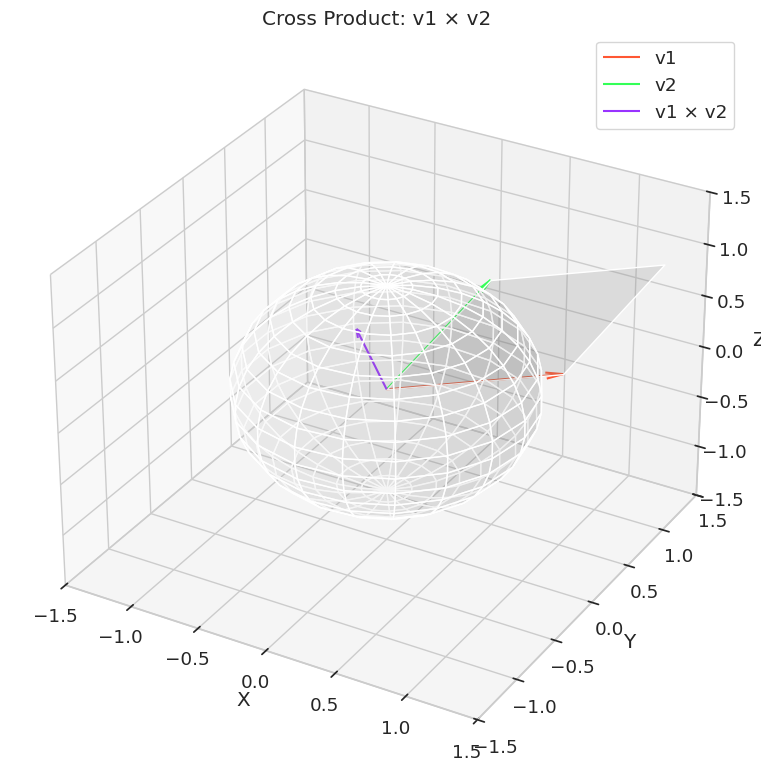

In [5]:
# Calculate cross product
v_cross = torch.tensor([
    v1[1] * v2[2] - v1[2] * v2[1],
    v1[2] * v2[0] - v1[0] * v2[2],
    v1[0] * v2[1] - v1[1] * v2[0]
])

# Create a figure to show cross product
fig = plt.figure(figsize=(12, 8))
ax = fig.add_subplot(111, projection='3d')

# Draw original vectors
ax.quiver(0, 0, 0, v1[0], v1[1], v1[2], color='#FF5733', arrow_length_ratio=0.1, label='v1')
ax.quiver(0, 0, 0, v2[0], v2[1], v2[2], color='#33FF57', arrow_length_ratio=0.1, label='v2')

# Draw the cross product vector
ax.quiver(0, 0, 0, v_cross[0], v_cross[1], v_cross[2], color='#9933FF', 
          arrow_length_ratio=0.1, label='v1 × v2')

# Create the parallelogram formed by the two vectors
X = np.array([[0, 0, 0], [v1[0], v1[1], v1[2]], 
              [v1[0]+v2[0], v1[1]+v2[1], v1[2]+v2[2]], [v2[0], v2[1], v2[2]]])
verts = [[X[0], X[1], X[2], X[3]]]
poly = Poly3DCollection(verts, alpha=0.2, facecolor='gray')
ax.add_collection3d(poly)

# Draw a light-colored unit sphere for reference
u = np.linspace(0, 2 * np.pi, 20)
v = np.linspace(0, np.pi, 20)
x = np.outer(np.cos(u), np.sin(v))
y = np.outer(np.sin(u), np.sin(v))
z = np.outer(np.ones(np.size(u)), np.cos(v))
ax.plot_surface(x, y, z, color='lightgray', alpha=0.1)

# Add labels and set title
ax.set_xlabel('X')
ax.set_ylabel('Y')
ax.set_zlabel('Z')
ax.set_title('Cross Product: v1 × v2')

# Set equal aspect ratio
max_val = max(torch.max(v1).item(), torch.max(v2).item(), torch.max(v_cross).item()) * 1.5
ax.set_xlim([-max_val, max_val])
ax.set_ylim([-max_val, max_val])
ax.set_zlim([-max_val, max_val])

ax.legend()
plt.tight_layout()
plt.show()


## Matrices as Linear Transformations

Linear transformations are operations that preserve vector addition and scalar multiplication. They can be represented by matrices. Let's visualize how matrices transform vectors and shapes in 3D space.


In [6]:
def plot_transformation_3d(matrix, vectors=None, grid=True, unit_cube=True, num_grid_points=3, 
                        title="3D Transformation"):
    """
    Visualize a 3D transformation matrix applied to vectors and/or a grid/cube.
    
    Args:
        matrix: 3x3 transformation matrix (torch tensor or numpy array)
        vectors: List of vectors to transform (optional)
        grid: Whether to show the transformed coordinate grid
        unit_cube: Whether to show the transformed unit cube
        num_grid_points: Number of grid points along each axis
        title: Plot title
    """
    # Convert matrix to numpy if it's a torch tensor
    if isinstance(matrix, torch.Tensor):
        matrix = matrix.numpy()
    
    fig = plt.figure(figsize=(15, 8))
    
    # Plot original space
    ax1 = fig.add_subplot(121, projection='3d')
    ax1.set_title("Original Space")
    
    # Plot transformed space
    ax2 = fig.add_subplot(122, projection='3d')
    ax2.set_title(f"After Transformation\n{title}")
    
    # Determine axis limits based on transformations
    # We'll use a unit cube and transform its vertices
    corners = np.array([
        [0, 0, 0], [1, 0, 0], [0, 1, 0], [1, 1, 0],
        [0, 0, 1], [1, 0, 1], [0, 1, 1], [1, 1, 1]
    ])
    corners = corners - 0.5  # Center around origin
    
    # Transform corners
    transformed_corners = np.dot(corners, matrix.T)
    
    # Calculate max dimensions for axis limits
    orig_max = np.max(np.abs(corners)) * 1.5
    trans_max = np.max(np.abs(transformed_corners)) * 1.5
    
    # Set axis limits
    ax1.set_xlim([-orig_max, orig_max])
    ax1.set_ylim([-orig_max, orig_max])
    ax1.set_zlim([-orig_max, orig_max])
    
    ax2.set_xlim([-trans_max, trans_max])
    ax2.set_ylim([-trans_max, trans_max])
    ax2.set_zlim([-trans_max, trans_max])
    
    # Add axis labels
    for ax in [ax1, ax2]:
        ax.set_xlabel('X')
        ax.set_ylabel('Y')
        ax.set_zlabel('Z')
    
    # Draw coordinate axes
    for ax, max_val in [(ax1, orig_max), (ax2, trans_max)]:
        ax.quiver(0, 0, 0, max_val, 0, 0, color='red', arrow_length_ratio=0.05, alpha=0.5)
        ax.quiver(0, 0, 0, 0, max_val, 0, color='green', arrow_length_ratio=0.05, alpha=0.5)
        ax.quiver(0, 0, 0, 0, 0, max_val, color='blue', arrow_length_ratio=0.05, alpha=0.5)
        
        # Add labels at the end of coordinate axes
        ax.text(max_val*1.1, 0, 0, "X", color='red')
        ax.text(0, max_val*1.1, 0, "Y", color='green')
        ax.text(0, 0, max_val*1.1, "Z", color='blue')
    
    # Draw vectors if provided
    if vectors is not None:
        # Convert vectors to numpy if they're torch tensors
        vectors = [v.numpy() if isinstance(v, torch.Tensor) else v for v in vectors]
        colors = plt.cm.tab10(np.linspace(0, 1, len(vectors)))
        
        for i, v in enumerate(vectors):
            # Draw original vector
            ax1.quiver(0, 0, 0, v[0], v[1], v[2], color=colors[i], 
                      arrow_length_ratio=0.1, label=f"v{i+1}")
            
            # Draw transformed vector
            v_transformed = np.dot(v, matrix.T)
            ax2.quiver(0, 0, 0, v_transformed[0], v_transformed[1], v_transformed[2], 
                      color=colors[i], arrow_length_ratio=0.1, label=f"T(v{i+1})")
    
    # Draw grid if requested
    if grid:
        grid_points = np.linspace(-0.5, 0.5, num_grid_points)
        X, Y, Z = np.meshgrid(grid_points, grid_points, grid_points)
        
        # Plot grid in original space
        ax1.scatter(X, Y, Z, color='gray', alpha=0.3, s=10)
        
        # Transform grid points
        points = np.vstack([X.flatten(), Y.flatten(), Z.flatten()]).T
        transformed_points = np.dot(points, matrix.T)
        
        # Plot transformed grid
        ax2.scatter(
            transformed_points[:, 0], 
            transformed_points[:, 1], 
            transformed_points[:, 2], 
            color='gray', alpha=0.3, s=10
        )
    
    # Draw unit cube if requested
    if unit_cube:
        # Create cube vertices (centered at origin)
        vertices = np.array([
            [-0.5, -0.5, -0.5], [0.5, -0.5, -0.5], [0.5, 0.5, -0.5], [-0.5, 0.5, -0.5],
            [-0.5, -0.5, 0.5], [0.5, -0.5, 0.5], [0.5, 0.5, 0.5], [-0.5, 0.5, 0.5]
        ])
        
        # Define faces using indices of vertices
        faces = [
            [0, 1, 2, 3],  # Bottom face
            [4, 5, 6, 7],  # Top face
            [0, 1, 5, 4],  # Front face
            [3, 2, 6, 7],  # Back face
            [0, 3, 7, 4],  # Left face
            [1, 2, 6, 5]   # Right face
        ]
        
        # Plot original cube
        for face_idx in faces:
            face = [vertices[idx] for idx in face_idx]
            poly = Poly3DCollection([face], alpha=0.2, facecolor='lightblue', edgecolor='blue')
            ax1.add_collection3d(poly)
        
        # Transform vertices
        transformed_vertices = np.dot(vertices, matrix.T)
        
        # Plot transformed cube
        for face_idx in faces:
            face = [transformed_vertices[idx] for idx in face_idx]
            poly = Poly3DCollection([face], alpha=0.2, facecolor='lightblue', edgecolor='blue')
            ax2.add_collection3d(poly)
    
    # Add legends
    if vectors is not None:
        ax1.legend()
        ax2.legend()
    
    plt.tight_layout()
    plt.show()
    
    return fig, (ax1, ax2)


### Basic Transformations

Let's visualize some basic transformations:


In [7]:
# Create some standard 3x3 transformation matrices
def create_transformation_matrices():
    # 1. Scaling
    scaling = torch.diag(torch.tensor([1.5, 0.8, 0.5]))
    
    # 2. Rotation around Z-axis (45 degrees)
    theta = torch.tensor(np.pi/4)  # 45 degrees
    rotation_z = torch.tensor([
        [torch.cos(theta), -torch.sin(theta), 0],
        [torch.sin(theta), torch.cos(theta), 0],
        [0, 0, 1]
    ])
    
    # 3. Rotation around Y-axis (30 degrees)
    phi = torch.tensor(np.pi/6)  # 30 degrees
    rotation_y = torch.tensor([
        [torch.cos(phi), 0, torch.sin(phi)],
        [0, 1, 0],
        [-torch.sin(phi), 0, torch.cos(phi)]
    ])
    
    # 4. Shear matrix
    shear = torch.eye(3)
    shear[0, 1] = 1.0  # Shear in x direction proportional to y
    
    # 5. Reflection through XY plane
    reflection = torch.eye(3)
    reflection[2, 2] = -1.0  # Negate z-coordinate
    
    # 6. Projection onto XY plane
    projection = torch.eye(3)
    projection[2, 2] = 0.0  # Zero out z-coordinate
    
    return {
        'Scaling': scaling,
        'Rotation (Z)': rotation_z,
        'Rotation (Y)': rotation_y,
        'Shear': shear,
        'Reflection': reflection,
        'Projection': projection
    }

# Get the transformation matrices
transformations = create_transformation_matrices()

# Create standard basis vectors
e1 = torch.tensor([1.0, 0.0, 0.0])
e2 = torch.tensor([0.0, 1.0, 0.0])
e3 = torch.tensor([0.0, 0.0, 1.0])
standard_basis = [e1, e2, e3]


#### Scaling Transformation


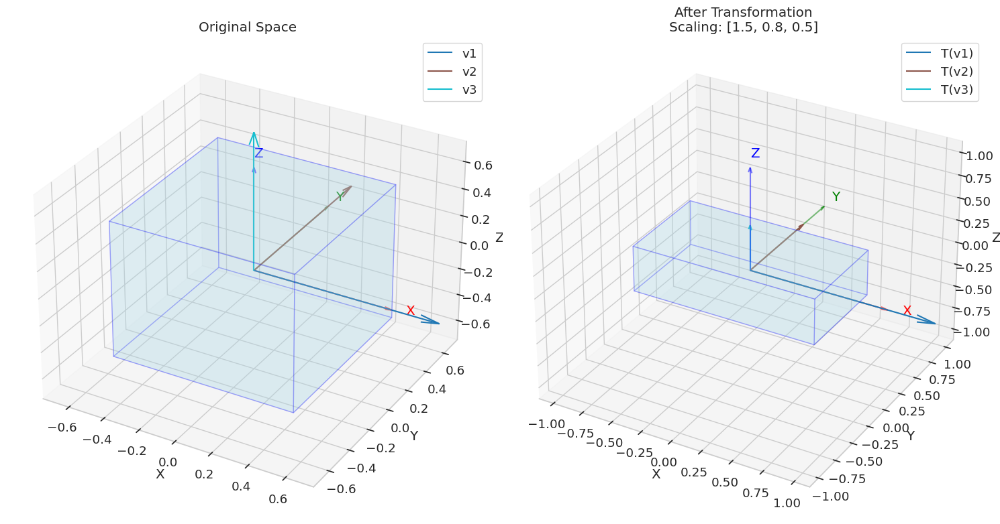

(<Figure size 1500x800 with 2 Axes>,
 (<Axes3D: title={'center': 'Original Space'}, xlabel='X', ylabel='Y', zlabel='Z'>,
  <Axes3D: title={'center': 'After Transformation\nScaling: [1.5, 0.8, 0.5]'}, xlabel='X', ylabel='Y', zlabel='Z'>))

In [8]:
# Visualize scaling transformation
plot_transformation_3d(
    transformations['Scaling'],
    vectors=standard_basis,
    grid=False,
    title="Scaling: [1.5, 0.8, 0.5]"
)


#### Rotation Transformations


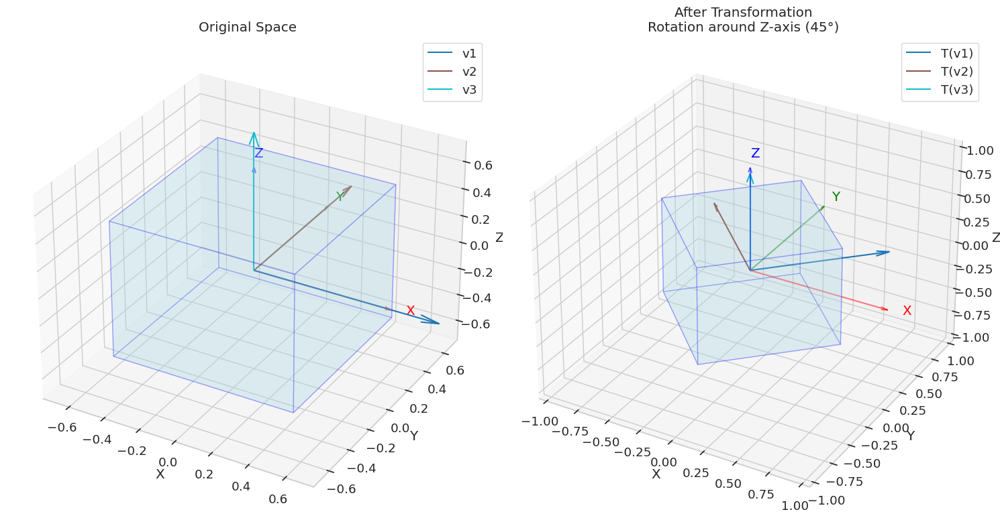

(<Figure size 1500x800 with 2 Axes>,
 (<Axes3D: title={'center': 'Original Space'}, xlabel='X', ylabel='Y', zlabel='Z'>,
  <Axes3D: title={'center': 'After Transformation\nRotation around Z-axis (45°)'}, xlabel='X', ylabel='Y', zlabel='Z'>))

In [9]:
# Visualize rotation around Z-axis
plot_transformation_3d(
    transformations['Rotation (Z)'],
    vectors=standard_basis,
    grid=False,
    title="Rotation around Z-axis (45°)"
)


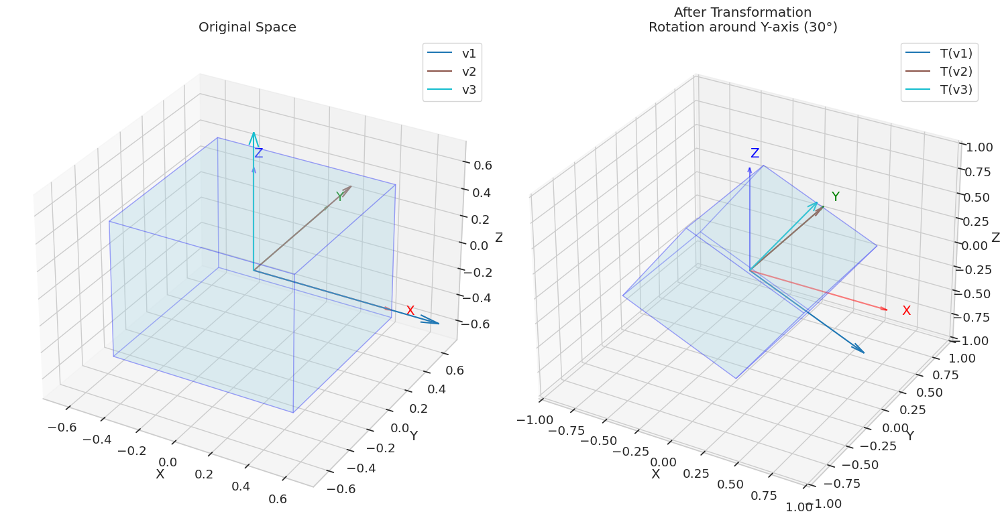

(<Figure size 1500x800 with 2 Axes>,
 (<Axes3D: title={'center': 'Original Space'}, xlabel='X', ylabel='Y', zlabel='Z'>,
  <Axes3D: title={'center': 'After Transformation\nRotation around Y-axis (30°)'}, xlabel='X', ylabel='Y', zlabel='Z'>))

In [10]:
# Visualize rotation around Y-axis
plot_transformation_3d(
    transformations['Rotation (Y)'],
    vectors=standard_basis,
    grid=False,
    title="Rotation around Y-axis (30°)"
)


#### Shear Transformation


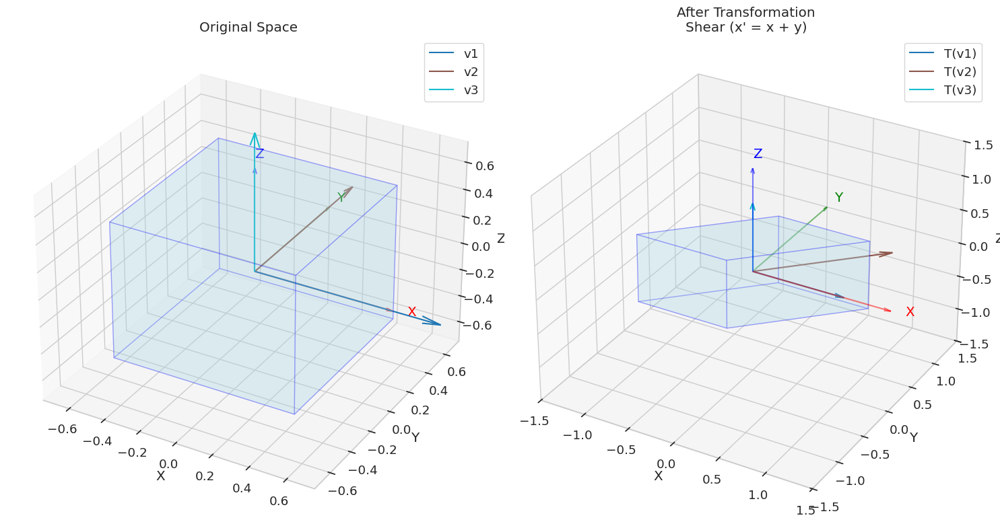

(<Figure size 1500x800 with 2 Axes>,
 (<Axes3D: title={'center': 'Original Space'}, xlabel='X', ylabel='Y', zlabel='Z'>,
  <Axes3D: title={'center': "After Transformation\nShear (x' = x + y)"}, xlabel='X', ylabel='Y', zlabel='Z'>))

In [11]:
# Visualize shear transformation
plot_transformation_3d(
    transformations['Shear'],
    vectors=standard_basis,
    grid=False,
    title="Shear (x' = x + y)"
)


#### Reflection and Projection


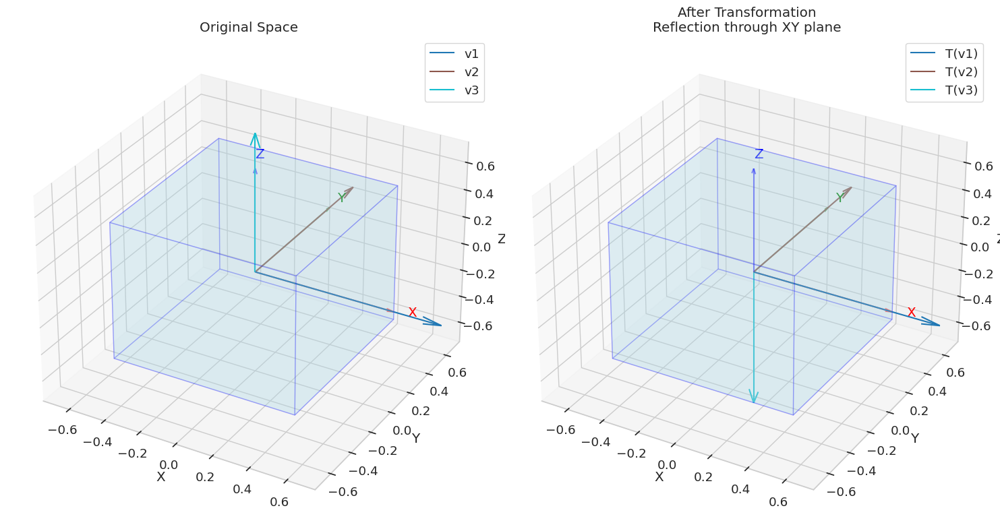

(<Figure size 1500x800 with 2 Axes>,
 (<Axes3D: title={'center': 'Original Space'}, xlabel='X', ylabel='Y', zlabel='Z'>,
  <Axes3D: title={'center': 'After Transformation\nReflection through XY plane'}, xlabel='X', ylabel='Y', zlabel='Z'>))

In [12]:
# Visualize reflection through XY plane
plot_transformation_3d(
    transformations['Reflection'],
    vectors=standard_basis,
    grid=False,
    title="Reflection through XY plane"
)


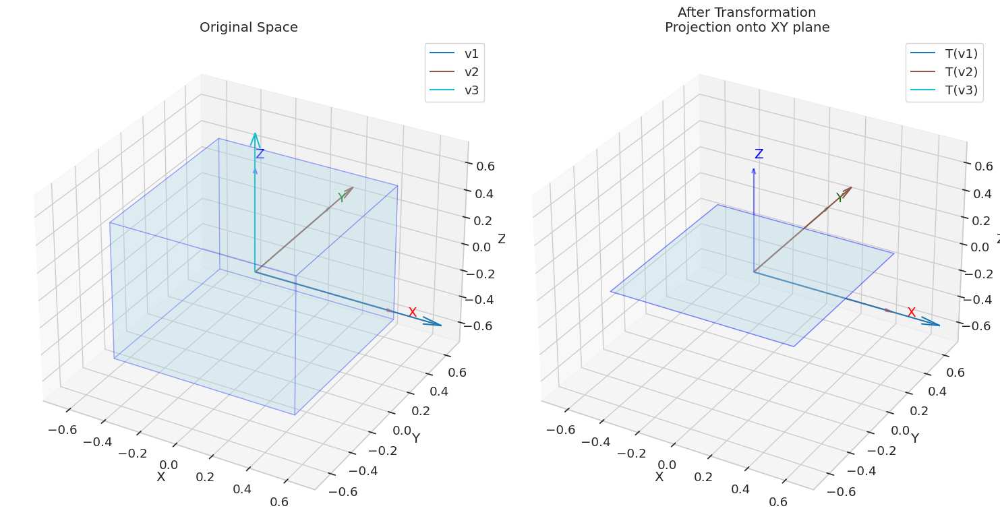

(<Figure size 1500x800 with 2 Axes>,
 (<Axes3D: title={'center': 'Original Space'}, xlabel='X', ylabel='Y', zlabel='Z'>,
  <Axes3D: title={'center': 'After Transformation\nProjection onto XY plane'}, xlabel='X', ylabel='Y', zlabel='Z'>))

In [13]:
# Visualize projection onto XY plane
plot_transformation_3d(
    transformations['Projection'],
    vectors=standard_basis,
    grid=False,
    title="Projection onto XY plane"
)


## Eigenvectors and Eigenvalues

Eigenvectors are vectors that, when transformed by a matrix, only get scaled (by their corresponding eigenvalues). Let's visualize them in 3D:


In [14]:
def plot_eigenvectors_3d(matrix, title="Eigenvectors and Eigenvalues"):
    """
    Visualize the eigenvectors and eigenvalues of a 3x3 matrix in 3D.
    
    Args:
        matrix: 3x3 matrix as torch tensor or numpy array
        title: Plot title
    """
    # Convert to torch tensor if numpy array
    if isinstance(matrix, np.ndarray):
        matrix = torch.tensor(matrix, dtype=torch.float32)
    
    # Calculate eigenvalues and eigenvectors
    eigenvalues, eigenvectors = torch.linalg.eig(matrix)
    
    # Convert complex eigenvalues/vectors to real if they're close to real
    if torch.is_complex(eigenvalues):
        # Check if imaginary parts are small
        if torch.all(torch.abs(eigenvalues.imag) < 1e-10):
            eigenvalues = eigenvalues.real
            eigenvectors = eigenvectors.real
    
    # Extract eigenvectors (column vectors)
    eigenvectors = [eigenvectors[:, i] for i in range(eigenvectors.shape[1])]
    
    # Create figure
    fig = plt.figure(figsize=(15, 8))
    
    # Plot original space with eigenvectors
    ax1 = fig.add_subplot(121, projection='3d')
    ax1.set_title("Original Space with Eigenvectors")
    
    # Plot transformed space
    ax2 = fig.add_subplot(122, projection='3d')
    ax2.set_title(f"After Transformation\n{title}")
    
    # Calculate max dimensions for axis limits
    max_val = max(1.5, *[torch.max(torch.abs(v)).item() * 2 for v in eigenvectors])
    
    # Set axis limits
    for ax in [ax1, ax2]:
        ax.set_xlim([-max_val, max_val])
        ax.set_ylim([-max_val, max_val])
        ax.set_zlim([-max_val, max_val])
        ax.set_xlabel('X')
        ax.set_ylabel('Y')
        ax.set_zlabel('Z')
    
    # Draw coordinate axes
    for ax in [ax1, ax2]:
        ax.quiver(0, 0, 0, max_val, 0, 0, color='red', arrow_length_ratio=0.05, alpha=0.3)
        ax.quiver(0, 0, 0, 0, max_val, 0, color='green', arrow_length_ratio=0.05, alpha=0.3)
        ax.quiver(0, 0, 0, 0, 0, max_val, color='blue', arrow_length_ratio=0.05, alpha=0.3)
    
    # Draw a light-colored unit sphere for reference
    u = np.linspace(0, 2 * np.pi, 20)
    v = np.linspace(0, np.pi, 20)
    x = np.outer(np.cos(u), np.sin(v))
    y = np.outer(np.sin(u), np.sin(v))
    z = np.outer(np.ones(np.size(u)), np.cos(v))
    for ax in [ax1, ax2]:
        ax.plot_surface(x, y, z, color='lightgray', alpha=0.1)
    
    # Colors for eigenvectors
    colors = ['#FF5733', '#33FF57', '#3357FF']
    
    # Draw eigenvectors and their transformations
    for i, (eigenvector, eigenvalue) in enumerate(zip(eigenvectors, eigenvalues)):
        # Normalize eigenvector for better visualization
        eigenvector_unit = eigenvector / torch.norm(eigenvector)
        
        # Scale to a reasonable length for visualization
        viz_length = min(max_val / 2, max(1.0, abs(eigenvalue.item())))
        eigenvector_viz = eigenvector_unit * viz_length
        
        # Original eigenvector
        ax1.quiver(0, 0, 0, eigenvector_viz[0], eigenvector_viz[1], eigenvector_viz[2], 
                  color=colors[i], arrow_length_ratio=0.1, 
                  label=f"λ{i+1}={eigenvalue.item():.2f}")
        
        # Transformed eigenvector
        transformed = torch.matmul(matrix, eigenvector_viz)
        ax2.quiver(0, 0, 0, transformed[0], transformed[1], transformed[2], 
                  color=colors[i], arrow_length_ratio=0.1, 
                  label=f"T(v{i+1})={eigenvalue.item():.2f}·v{i+1}")
        
        # Draw a line showing the span of the eigenvector
        line_points = torch.stack([-eigenvector_viz*1.5, eigenvector_viz*1.5])
        ax1.plot(line_points[:, 0], line_points[:, 1], line_points[:, 2], 
                color=colors[i], alpha=0.3, linestyle='--')
    
    # Add legends
    ax1.legend()
    ax2.legend()
    
    plt.tight_layout()
    plt.show()
    
    return fig, (ax1, ax2)


Let's create a matrix with real eigenvalues and visualize its eigenvectors:


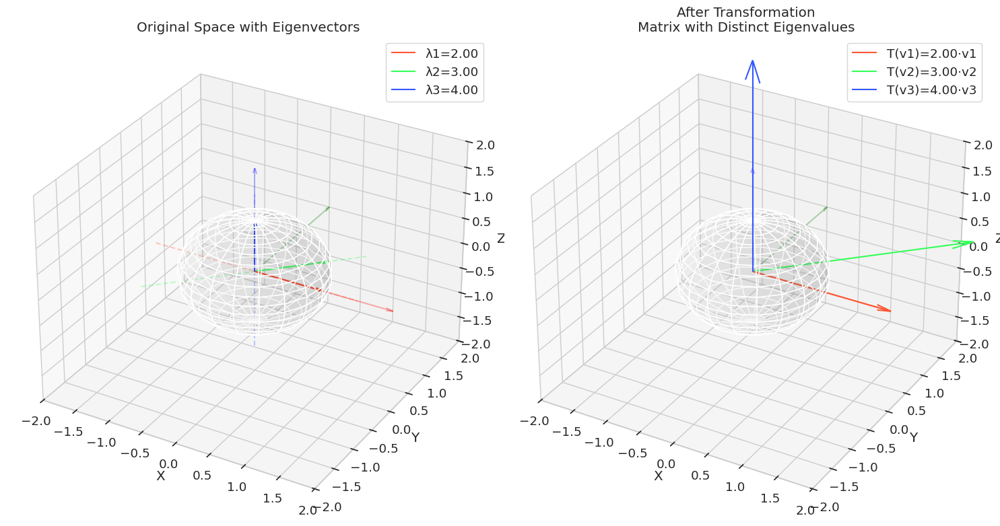

(<Figure size 1500x800 with 2 Axes>,
 (<Axes3D: title={'center': 'Original Space with Eigenvectors'}, xlabel='X', ylabel='Y', zlabel='Z'>,
  <Axes3D: title={'center': 'After Transformation\nMatrix with Distinct Eigenvalues'}, xlabel='X', ylabel='Y', zlabel='Z'>))

In [15]:
# Create a matrix with distinct real eigenvalues
A = torch.tensor([
    [2.0, 1.0, 0.0],
    [0.0, 3.0, 0.0],
    [0.0, 0.0, 4.0]
])

# Visualize eigenvectors
plot_eigenvectors_3d(A, title="Matrix with Distinct Eigenvalues")


### Visualizing a Matrix with Repeated Eigenvalues


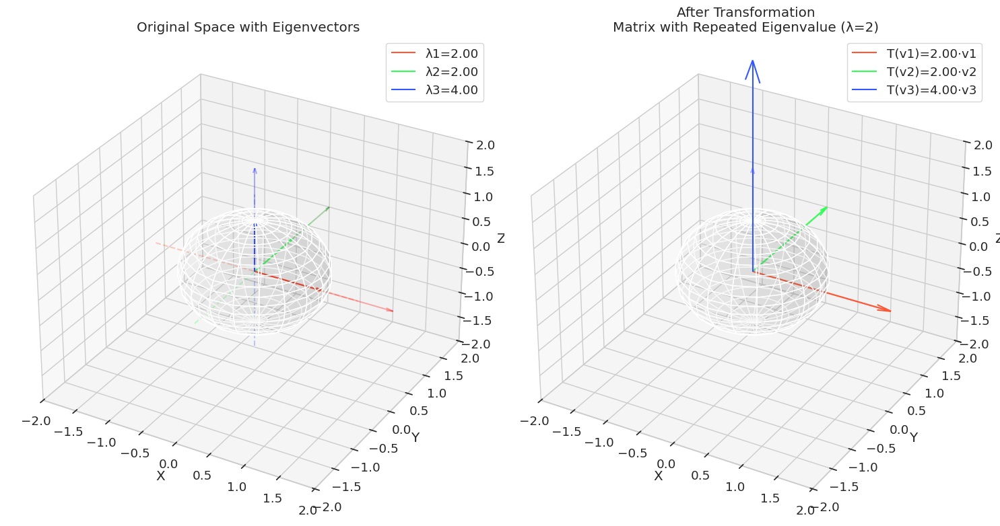

(<Figure size 1500x800 with 2 Axes>,
 (<Axes3D: title={'center': 'Original Space with Eigenvectors'}, xlabel='X', ylabel='Y', zlabel='Z'>,
  <Axes3D: title={'center': 'After Transformation\nMatrix with Repeated Eigenvalue (λ=2)'}, xlabel='X', ylabel='Y', zlabel='Z'>))

In [16]:
# Create a matrix with a repeated eigenvalue
B = torch.tensor([
    [2.0, 0.0, 0.0],
    [0.0, 2.0, 0.0],
    [0.0, 0.0, 4.0]
])

# Visualize eigenvectors
plot_eigenvectors_3d(B, title="Matrix with Repeated Eigenvalue (λ=2)")


### Visualizing a Rotation Matrix

Rotation matrices have complex eigenvalues. Let's see what happens:


Rotation matrix:
tensor([[ 0.5000, -0.8660,  0.0000],
        [ 0.8660,  0.5000,  0.0000],
        [ 0.0000,  0.0000,  1.0000]])

When applied to z-axis:
tensor([0., 0., 1.])
This shows z-axis is an eigenvector with eigenvalue 1.


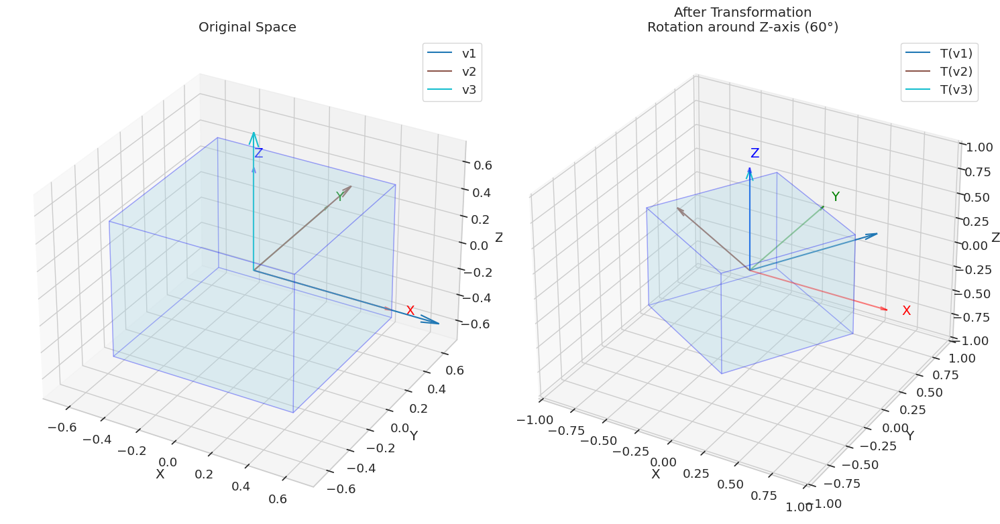

(<Figure size 1500x800 with 2 Axes>,
 (<Axes3D: title={'center': 'Original Space'}, xlabel='X', ylabel='Y', zlabel='Z'>,
  <Axes3D: title={'center': 'After Transformation\nRotation around Z-axis (60°)'}, xlabel='X', ylabel='Y', zlabel='Z'>))

In [17]:
# Create a 3D rotation matrix - rotation of 60° around the z-axis
theta = np.pi/3  # 60 degrees
cos_theta = np.cos(theta)
sin_theta = np.sin(theta)
R = torch.tensor([
    [cos_theta, -sin_theta, 0],
    [sin_theta, cos_theta, 0],
    [0, 0, 1]
], dtype=torch.float32)

# For rotation matrices, we know that the z-axis is an eigenvector with eigenvalue 1
# Let's just show this known eigenvector instead of computing all eigenvectors
z_axis = torch.tensor([0.0, 0.0, 1.0])

print("Rotation matrix:")
print(R)
print("\nWhen applied to z-axis:")
print(torch.matmul(R, z_axis))
print("This shows z-axis is an eigenvector with eigenvalue 1.")

# Skip visualization here as rotation matrices have complex eigenvectors
# which are harder to visualize properly
# Instead, let's visualize the rotation applied to the standard basis
plot_transformation_3d(
    R,
    vectors=[torch.tensor([1.0, 0.0, 0.0]), 
             torch.tensor([0.0, 1.0, 0.0]), 
             torch.tensor([0.0, 0.0, 1.0])],
    grid=False,
    title="Rotation around Z-axis (60°)"
)


The rotation matrix has one real eigenvector (along the z-axis) and two complex eigenvectors. The real eigenvector corresponds to the axis of rotation.


## Animating Matrix Transformations

Let's create an animation to visualize how points are transformed by a matrix as we interpolate from the identity matrix to the transformation:


In [18]:
def create_transformation_animation(matrix, frames=60, grid_points=5):
    """
    Create an animation of a gradual transformation from identity to the target matrix.
    
    Args:
        matrix: The target transformation matrix (3x3)
        frames: Number of frames in the animation
        grid_points: Number of grid points in each dimension
    
    Returns:
        Animation object
    """
    if isinstance(matrix, torch.Tensor):
        matrix = matrix.numpy()
    
    # Create figure and axes
    fig = plt.figure(figsize=(10, 8))
    ax = fig.add_subplot(111, projection='3d')
    
    # Create a unit cube centered at the origin
    vertices = np.array([
        [-0.5, -0.5, -0.5], [0.5, -0.5, -0.5], [0.5, 0.5, -0.5], [-0.5, 0.5, -0.5],
        [-0.5, -0.5, 0.5], [0.5, -0.5, 0.5], [0.5, 0.5, 0.5], [-0.5, 0.5, 0.5]
    ])
    
    # Define cube edges by connecting vertices
    edges = [
        (0, 1), (1, 2), (2, 3), (3, 0),  # Bottom face
        (4, 5), (5, 6), (6, 7), (7, 4),  # Top face
        (0, 4), (1, 5), (2, 6), (3, 7)   # Connecting edges
    ]
    
    # Create a grid of points inside the cube
    grid = np.linspace(-0.5, 0.5, grid_points)
    X, Y, Z = np.meshgrid(grid, grid, grid)
    points = np.vstack([X.flatten(), Y.flatten(), Z.flatten()]).T
    
    # Calculate the transformed points for the final frame
    transformed_points = np.dot(points, matrix.T)
    max_val = max(1.5, np.max(np.abs(transformed_points))) * 1.2
    
    # Set axis limits
    ax.set_xlim([-max_val, max_val])
    ax.set_ylim([-max_val, max_val])
    ax.set_zlim([-max_val, max_val])
    
    # Add axis labels
    ax.set_xlabel('X')
    ax.set_ylabel('Y')
    ax.set_zlabel('Z')
    
    # Create a title with the transformation description
    def matrix_to_str(m):
        # Convert matrix to a readable string
        return np.array2string(m, precision=2, separator=', ')
    
    ax.set_title(f"Transformation: Identity → \n{matrix_to_str(matrix)}")
    
    # Initialize points to visualize
    scatter = ax.scatter(points[:, 0], points[:, 1], points[:, 2], 
                         c=np.sum(points**2, axis=1), cmap='viridis', s=20)
    
    # Initialize edges as separate Line3D objects
    lines = []
    for edge in edges:
        line, = ax.plot([vertices[edge[0], 0], vertices[edge[1], 0]],
                        [vertices[edge[0], 1], vertices[edge[1], 1]],
                        [vertices[edge[0], 2], vertices[edge[1], 2]], 'k-', lw=1)
        lines.append(line)
    
    # Function to update the plot for each animation frame
    def update(frame):
        # Interpolate between identity and target matrix
        t = frame / (frames - 1)
        current_matrix = (1 - t) * np.eye(3) + t * matrix
        
        # Transform points
        current_points = np.dot(points, current_matrix.T)
        scatter._offsets3d = (current_points[:, 0], current_points[:, 1], current_points[:, 2])
        
        # Transform vertices
        current_vertices = np.dot(vertices, current_matrix.T)
        
        # Update edges
        for i, (v1, v2) in enumerate(edges):
            lines[i].set_data([current_vertices[v1, 0], current_vertices[v2, 0]],
                             [current_vertices[v1, 1], current_vertices[v2, 1]])
            lines[i].set_3d_properties([current_vertices[v1, 2], current_vertices[v2, 2]])
        
        # Update title with interpolation percentage
        ax.set_title(f"Transformation: {int(t*100)}% complete")
        
        return [scatter] + lines
    
    # Create the animation
    anim = animation.FuncAnimation(fig, update, frames=frames, interval=50, blit=False)
    
    return anim


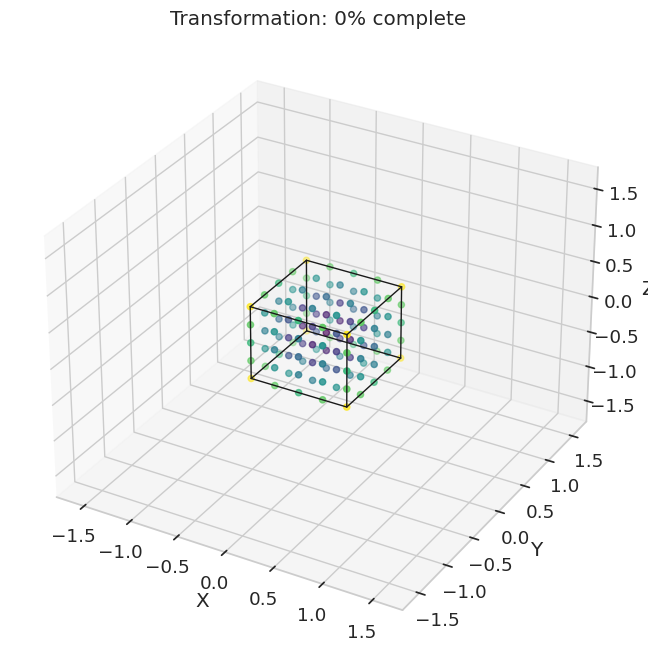

In [19]:
# Create an animation for a rotation matrix
anim_rotation = create_transformation_animation(transformations['Rotation (Z)'].numpy())

# Display the animation
HTML(anim_rotation.to_jshtml())


## Projections and Subspaces

Let's visualize projections onto different subspaces in 3D:


In [20]:
def plot_projection_3d(projection_matrix, vectors=None, title="Projection onto Subspace"):
    """
    Visualize a projection matrix and the subspace it projects onto.
    
    Args:
        projection_matrix: 3x3 projection matrix
        vectors: Optional list of vectors to show being projected
        title: Plot title
    """
    if isinstance(projection_matrix, torch.Tensor):
        projection_matrix = projection_matrix.numpy()
    
    # Create a figure
    fig = plt.figure(figsize=(15, 8))
    
    # Plot original space
    ax1 = fig.add_subplot(121, projection='3d')
    ax1.set_title("Original Space with Vectors")
    
    # Plot projected space
    ax2 = fig.add_subplot(122, projection='3d')
    ax2.set_title(f"After Projection\n{title}")
    
    # Create a grid of points to visualize the subspace
    grid_range = 0.8
    x = np.linspace(-grid_range, grid_range, 10)
    y = np.linspace(-grid_range, grid_range, 10)
    z = np.linspace(-grid_range, grid_range, 10)
    
    # Get the rank and nullity of the projection matrix
    rank = np.linalg.matrix_rank(projection_matrix)
    
    # Create appropriate grid based on rank
    if rank == 1:  # Line
        # Find the image basis (the line direction)
        U, S, Vt = np.linalg.svd(projection_matrix)
        direction = Vt[0]  # First right singular vector
        
        # Create points along the line
        line_points = np.outer(np.linspace(-grid_range, grid_range, 20), direction)
        
        # Plot the line in both spaces
        ax1.plot(line_points[:, 0], line_points[:, 1], line_points[:, 2], 
                'b-', alpha=0.5, label="Image (Line)")
        ax2.plot(line_points[:, 0], line_points[:, 1], line_points[:, 2], 
                'b-', alpha=0.5, label="Image (Line)")
    
    elif rank == 2:  # Plane
        # Find the image basis (the plane normal)
        U, S, Vt = np.linalg.svd(projection_matrix)
        normal = Vt[2]  # Third right singular vector (nullspace)
        
        # Find two vectors in the plane
        v1 = np.array([1, 0, -normal[0]/normal[2]]) if abs(normal[2]) > 1e-6 else np.array([1, 0, 0])
        v1 = v1 / np.linalg.norm(v1)
        v2 = np.cross(normal, v1)
        v2 = v2 / np.linalg.norm(v2)
        
        # Create a grid in the plane
        grid_points = np.array([[i*v1 + j*v2 for i in np.linspace(-grid_range, grid_range, 10)] 
                              for j in np.linspace(-grid_range, grid_range, 10)])
        
        # Plot the plane in both spaces
        for i in range(grid_points.shape[0]):
            ax1.plot(grid_points[i, :, 0], grid_points[i, :, 1], grid_points[i, :, 2], 
                    'b-', alpha=0.2)
            ax2.plot(grid_points[i, :, 0], grid_points[i, :, 1], grid_points[i, :, 2], 
                    'b-', alpha=0.2)
        
        for j in range(grid_points.shape[1]):
            ax1.plot(grid_points[:, j, 0], grid_points[:, j, 1], grid_points[:, j, 2], 
                    'b-', alpha=0.2)
            ax2.plot(grid_points[:, j, 0], grid_points[:, j, 1], grid_points[:, j, 2], 
                    'b-', alpha=0.2)
        
        # Add a patch to show the plane more clearly
        plane_corners = np.array([
            grid_range * (v1 + v2),
            grid_range * (v1 - v2),
            grid_range * (-v1 - v2),
            grid_range * (-v1 + v2)
        ])
        
        for ax in [ax1, ax2]:
            poly = Poly3DCollection([plane_corners], alpha=0.2, facecolor='blue', edgecolor='blue')
            ax.add_collection3d(poly)
            ax.scatter([0], [0], [0], color='red', s=50)  # Origin
    
    # Set common properties for both axes
    for ax in [ax1, ax2]:
        ax.set_xlim([-1.2, 1.2])
        ax.set_ylim([-1.2, 1.2])
        ax.set_zlim([-1.2, 1.2])
        ax.set_xlabel('X')
        ax.set_ylabel('Y')
        ax.set_zlabel('Z')
        
        # Add coordinate axes
        ax.quiver(0, 0, 0, 1, 0, 0, color='red', alpha=0.5, arrow_length_ratio=0.05)
        ax.quiver(0, 0, 0, 0, 1, 0, color='green', alpha=0.5, arrow_length_ratio=0.05)
        ax.quiver(0, 0, 0, 0, 0, 1, color='blue', alpha=0.5, arrow_length_ratio=0.05)
    
    # Draw vectors if provided
    if vectors is not None:
        # Convert vectors to numpy if they're torch tensors
        vectors = [v.numpy() if isinstance(v, torch.Tensor) else v for v in vectors]
        colors = plt.cm.tab10(np.linspace(0, 1, len(vectors)))
        
        for i, v in enumerate(vectors):
            # Draw original vector
            ax1.quiver(0, 0, 0, v[0], v[1], v[2], color=colors[i], 
                      arrow_length_ratio=0.1, label=f"v{i+1}")
            
            # Draw projection line
            v_proj = np.dot(projection_matrix, v)
            ax1.plot([0, v[0], v_proj[0]], [0, v[1], v_proj[1]], [0, v[2], v_proj[2]], 
                    color=colors[i], linestyle='--', alpha=0.5)
            
            # Draw projected vector in original space
            ax1.quiver(0, 0, 0, v_proj[0], v_proj[1], v_proj[2], color=colors[i], 
                      arrow_length_ratio=0.1, alpha=0.5, linestyle='-')
            
            # Draw projected vector in projected space
            ax2.quiver(0, 0, 0, v_proj[0], v_proj[1], v_proj[2], color=colors[i], 
                      arrow_length_ratio=0.1, label=f"proj(v{i+1})")
    
    # Add legends
    ax1.legend()
    ax2.legend()
    
    plt.tight_layout()
    plt.show()
    
    return fig, (ax1, ax2)


### Projection onto a Line


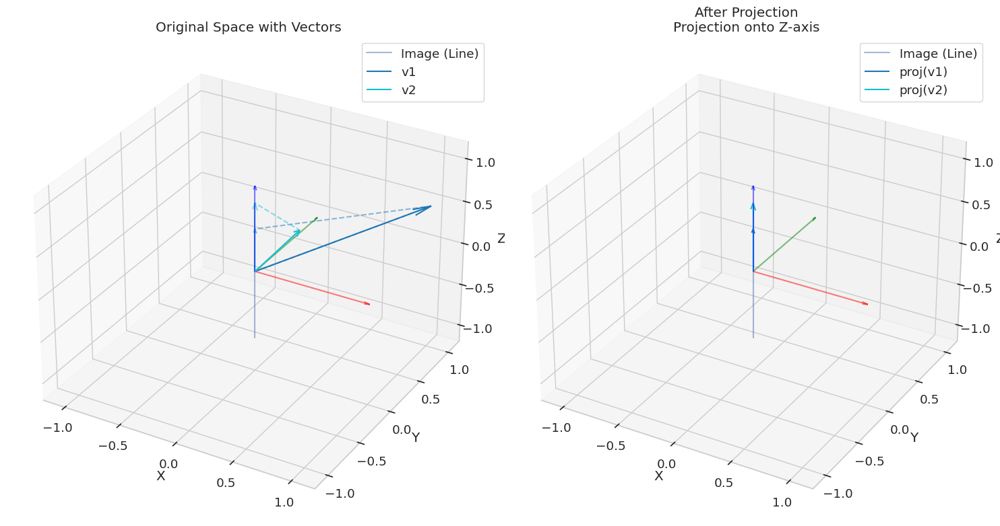

(<Figure size 1500x800 with 2 Axes>,
 (<Axes3D: title={'center': 'Original Space with Vectors'}, xlabel='X', ylabel='Y', zlabel='Z'>,
  <Axes3D: title={'center': 'After Projection\nProjection onto Z-axis'}, xlabel='X', ylabel='Y', zlabel='Z'>))

In [21]:
# Create a projection matrix for projection onto the z-axis
proj_z = torch.tensor([
    [0.0, 0.0, 0.0],
    [0.0, 0.0, 0.0],
    [0.0, 0.0, 1.0]
])

# Create some vectors to project
v1 = torch.tensor([1.0, 1.0, 0.5])
v2 = torch.tensor([0.5, -0.2, 0.8])

# Visualize the projection
plot_projection_3d(proj_z, vectors=[v1, v2], title="Projection onto Z-axis")


### Projection onto a Plane


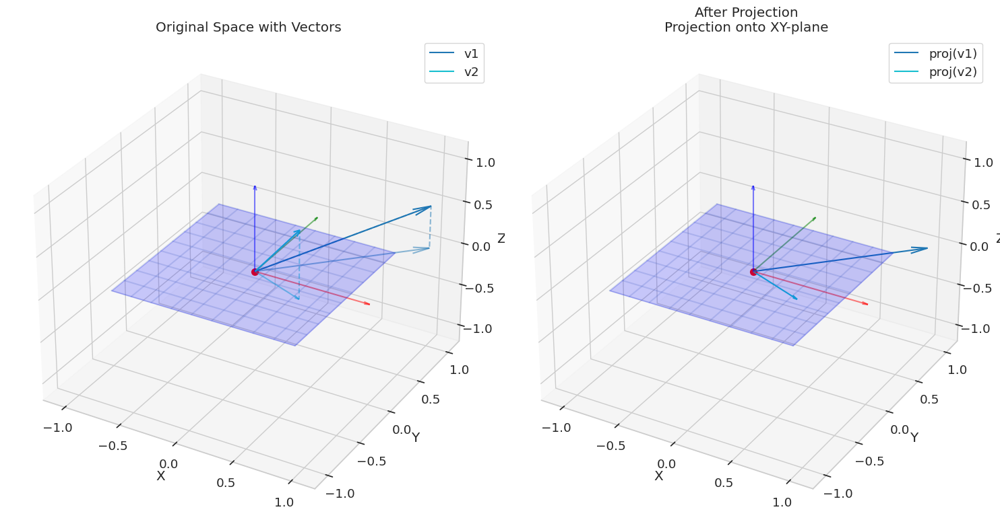

(<Figure size 1500x800 with 2 Axes>,
 (<Axes3D: title={'center': 'Original Space with Vectors'}, xlabel='X', ylabel='Y', zlabel='Z'>,
  <Axes3D: title={'center': 'After Projection\nProjection onto XY-plane'}, xlabel='X', ylabel='Y', zlabel='Z'>))

In [22]:
# Create a projection matrix for projection onto the xy-plane
proj_xy = torch.tensor([
    [1.0, 0.0, 0.0],
    [0.0, 1.0, 0.0],
    [0.0, 0.0, 0.0]
])

# Visualize the projection
plot_projection_3d(proj_xy, vectors=[v1, v2], title="Projection onto XY-plane")


## Summary

In this notebook, we've explored 3D visualizations of matrices as linear transformations:

1. **Vector Visualization**: We learned how to visualize vectors and vector operations in 3D space
2. **Matrix Transformations**: We saw how matrices transform vectors, grids, and shapes
3. **Eigenvectors**: We visualized eigenvectors and eigenvalues in 3D space
4. **Animation**: We created animations to show the gradual effect of transformations
5. **Projections**: We visualized projections onto lines and planes

These visualizations help build intuition for abstract linear algebra concepts by showing their geometric interpretation. In the next notebook, we'll explore more advanced visualization techniques, including animated transformations and interactive visualizations.